<a href="https://colab.research.google.com/github/HabilMB/Deteksi-Sampah/blob/main/Waste_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import TACO dataset

In [ ]:
import os
import shutil
import zipfile
import matplotlib.pyplot as plt
import tensorflow as tf
from google.colab import files
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
#from tensorflow.keras import layers
#from tensorflow.keras import Model
#from tensorflow.keras.optimizers import RMSprop
#from tensorflow.keras.preprocessing.image import ImageDataGenerator
#from tensorflow.keras.preprocessing.image import img_to_array, load_img

In [ ]:
!python -c 'import tensorflow as tf; print(tf.__version__)'

In [ ]:
!wget https://zenodo.org/record/3587843/files/TACO.zip

--2022-06-12 11:29:42--  https://zenodo.org/record/3587843/files/TACO.zip
Resolving zenodo.org (zenodo.org)... 137.138.76.77
Connecting to zenodo.org (zenodo.org)|137.138.76.77|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2719810615 (2.5G) [application/octet-stream]
Saving to: ‘TACO.zip’

TACO.zip            100%[===================>]   2.53G  23.4MB/s    in 2m 43s  

2022-06-12 11:32:26 (15.9 MB/s) - ‘TACO.zip’ saved [2719810615/2719810615]



In [ ]:
!unzip /content/TACO.zip

Archive:  /content/TACO.zip
   creating: TACO/
  inflating: TACO/.DS_Store          
   creating: __MACOSX/
   creating: __MACOSX/TACO/
  inflating: __MACOSX/TACO/._.DS_Store  
   creating: TACO/.git/
  inflating: TACO/.git/.DS_Store     
   creating: __MACOSX/TACO/.git/
  inflating: __MACOSX/TACO/.git/._.DS_Store  
   creating: TACO/.git/branches/
  inflating: TACO/.git/COMMIT_EDITMSG  
  inflating: TACO/.git/config        
  inflating: TACO/.git/description   
  inflating: TACO/.git/FETCH_HEAD    
  inflating: TACO/.git/HEAD          
   creating: TACO/.git/hooks/
  inflating: TACO/.git/hooks/applypatch-msg.sample  
  inflating: TACO/.git/hooks/commit-msg.sample  
  inflating: TACO/.git/hooks/post-update.sample  
  inflating: TACO/.git/hooks/pre-applypatch.sample  
  inflating: TACO/.git/hooks/pre-commit.sample  
  inflating: TACO/.git/hooks/pre-push.sample  
  inflating: TACO/.git/hooks/pre-rebase.sample  
  inflating: TACO/.git/hooks/pre-receive.sample  
  inflating: TACO/.git/hook

# Convert TACO to YOLO

In [ ]:
!pip install Cython
!pip install pycocotools

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
%cd /content/
!git clone https://github.com/ssaru/convert2Yolo

/content
Cloning into 'convert2Yolo'...
remote: Enumerating objects: 215, done.
remote: Counting objects: 100% (43/43), done.
remote: Compressing objects: 100% (8/8), done.
remote: Total 215 (delta 38), reused 35 (delta 35), pack-reused 172
Receiving objects: 100% (215/215), 994.67 KiB | 17.45 MiB/s, done.
Resolving deltas: 100% (95/95), done.


**upload file .names dulu**

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving model.tflite to model.tflite


In [ ]:
# convert per batch
%cd /content/convert2Yolo
%mkdir /content/YOLO/batch_1/
%mkdir /content/YOLO/batch_2/
!python3 example.py --datasets COCO --img_path /content/TACO/data/batch_1 --label /content/TACO/data/batch_1/annotations.json --convert_output_path /content/YOLO/batch_1 --img_type ".jpg" --manifest_path ./ --cls_list_file /content/category.names
!python3 example.py --datasets COCO --img_path /content/TACO/data/batch_2 --label /content/TACO/data/batch_2/annotations.json --convert_output_path /content/YOLO/batch_2 --img_type ".jpg" --manifest_path ./ --cls_list_file /content/category.names

/content/convert2Yolo
mkdir: cannot create directory ‘/content/YOLO/batch_1/’: File exists
mkdir: cannot create directory ‘/content/YOLO/batch_2/’: File exists

COCO Parsing:  |████████████████████████████████████████| 100.0% (309/309)  Complete


YOLO Generating Result : False, msg : ERROR : maximum recursion depth exceeded in comparison, moreInfo : <class 'RecursionError'>	Format.py	763

COCO Parsing:  |████████████████████████████████████████| 100.0% (288/288)  Complete


YOLO Generating Result : False, msg : ERROR : maximum recursion depth exceeded in comparison, moreInfo : <class 'RecursionError'>	Format.py	763


In [ ]:
#convert all
%cd /content/convert2Yolo

import subprocess

path = '/content/TACO/data'
#os.mkdir('/content/YOLO/')

for batches in os.listdir(path):
  batch = os.path.join(path, batches)
  if os.path.isdir(batch):
    label = os.path.join(batch, 'annotations.json')
    output_path = os.path.join('/content/YOLO/', batches)
    #os.mkdir(output_path)
    output = output_path
    #!python3 example.py --datasets COCO --img_path batch --label label --convert_output_path output --img_type ".jpg" --manifest_path ./ --cls_list_file /content/TACO/taco.names
    subprocess.run(['python3', 'example.py', '--datasets', 'COCO', '--img_path', batch, '--label', label, '--convert_output_path', output, '--img_type', '".jpg"', '--manifest_path', './', '--cls_list_file', '/content/category.names'])

/content/convert2Yolo


download yolo txt format

In [ ]:
!zip -r /content/TACOtxt.zip /content/YOLO
files.download("/content/TACOtxt.zip")

##**Upload merged folder, then split-folder**


In [1]:
!pip install split-folders
!pip install patool
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 77 kB 4.0 MB/s 
Mounted at /content/gdrive


In [ ]:
import patoolib
patoolib.extract_archive("/content/gdrive/MyDrive/Capstone/TACO converted.rar", outdir="/content/")

In [ ]:
%mkdir /content/TACO_split/images
%mkdir /content/TACO_split/labels
!splitfolders --ratio .7 .25 .05 --output /content/TACO_split/images -- '/content/TACO converted/images' 
!splitfolders --ratio .7 .25 .05 --output /content/TACO_split/labels -- '/content/TACO converted/labels' 

# Download split TACO set

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!zip -r /content/TACO_split_75.zip /content/TACO_split

In [ ]:
#put on drive then download
!cp /content/TACO_split_75.zip '/content/gdrive/My Drive/Capstone/'
 

In [ ]:
!ls -lt '/content/gdrive/My Drive/Capstone/'

In [ ]:
!gdown /content/gdrive/MyDrive/Capstone/TACO_split_75.zip

In [ ]:
!unzip "/content/gdrive/MyDrive/Capstone/TACO_data.zip"

# Import YOLO

Import split data

In [ ]:
!wget https://zenodo.org/record/6596667/files/TACO_data_75.zip

--2022-06-06 04:40:42--  https://zenodo.org/record/6596667/files/TACO_data_75.zip
Resolving zenodo.org (zenodo.org)... 137.138.76.77
Connecting to zenodo.org (zenodo.org)|137.138.76.77|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2611669070 (2.4G) [application/octet-stream]
Saving to: ‘TACO_data_75.zip’

TACO_data_75.zip    100%[===================>]   2.43G  25.4MB/s    in 2m 3s   

2022-06-06 04:42:47 (20.3 MB/s) - ‘TACO_data_75.zip’ saved [2611669070/2611669070]



In [ ]:
!unzip /content/TACO_data_75.zip

Archive:  /content/TACO_data_75.zip
   creating: TACO_data_75/
   creating: TACO_data_75/test/
   creating: TACO_data_75/test/images/
   creating: TACO_data_75/test/images/batch_1/
  inflating: TACO_data_75/test/images/batch_1/000060.jpg  
  inflating: TACO_data_75/test/images/batch_1/000086.JPG  
  inflating: TACO_data_75/test/images/batch_1/000092.JPG  
  inflating: TACO_data_75/test/images/batch_1/000093.JPG  
  inflating: TACO_data_75/test/images/batch_1/000099.JPG  
  inflating: TACO_data_75/test/images/batch_1/000115.JPG  
   creating: TACO_data_75/test/images/batch_10/
  inflating: TACO_data_75/test/images/batch_10/000046.jpg  
  inflating: TACO_data_75/test/images/batch_10/000068.jpg  
  inflating: TACO_data_75/test/images/batch_10/000073.jpg  
  inflating: TACO_data_75/test/images/batch_10/000079.jpg  
  inflating: TACO_data_75/test/images/batch_10/000090.jpg  
   creating: TACO_data_75/test/images/batch_11/
  inflating: TACO_data_75/test/images/batch_11/000046.jpg  
  inflati

In [3]:
%cd Capstone
!git clone https://github.com/ultralytics/yolov5.git  # clone
%cd yolov5
%pip install -qr requirements.txt  # install

import torch
import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v6.1-251-gc23a441 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 38.7/78.2 GB disk)


Run YOLO on TACO yaml

In [ ]:
%cd yolov5
!python train.py --img 800 --epochs 500 --data ../taco75.yaml --optimizer SGD --weights 'YOLOv5x' --cfg models/hub/yolov5s6.yaml --cache

[Errno 2] No such file or directory: 'yolov5'
/content
python3: can't open file 'train.py': [Errno 2] No such file or directory


In [ ]:
!python val.py --weights runs/train/exp/weights/best.pt --data '/content/taco75.yaml'  --img 640

val: data=/content/taco75.yaml, weights=['runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.1-244-g47233e1 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5s6 summary: 280 layers, 12550876 parameters, 0 gradients, 16.7 GFLOPs
val: Scanning '/content/yolov5/../TACO_data_75/val/labels/batch_1.cache' images and labels... 373 found, 0 missing, 0 empty, 0 corrupt: 100% 373/373 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 12/12 [00:56<00:00,  4.69s/it]
                 all        373       1133      0.258      0.134      0.106     0.0765
Speed: 1.0ms pre-process, 6.5ms inference, 1.7ms NMS per image at shape (32, 3, 640, 640)
Re

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs/train

<IPython.core.display.Javascript object>

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.25 --source /content/TACO_data_75/test/images/batch_10
#display.Image(filename='runs/detect/exp2/000024.jpg', width=600)

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/TACO_data_75/test/images/batch_10, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-244-g47233e1 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5s6 summary: 280 layers, 12550876 parameters, 0 gradients, 16.7 GFLOPs
image 1/5 /content/TACO_data_75/test/images/batch_10/000046.jpg: 640x320 1 Disposable plastic cup, Done. (0.020s)
image 2/5 /content/TACO_data_75/test/images/batch_10/000068.jpg: 640x320 1 Disposable plastic cup, 1 Unlabeled litter, 2 Other plastics, Done. (0.013s)
image 3/5 /content/TACO_data_75/test/images/batch_10/000073.jpg: 32

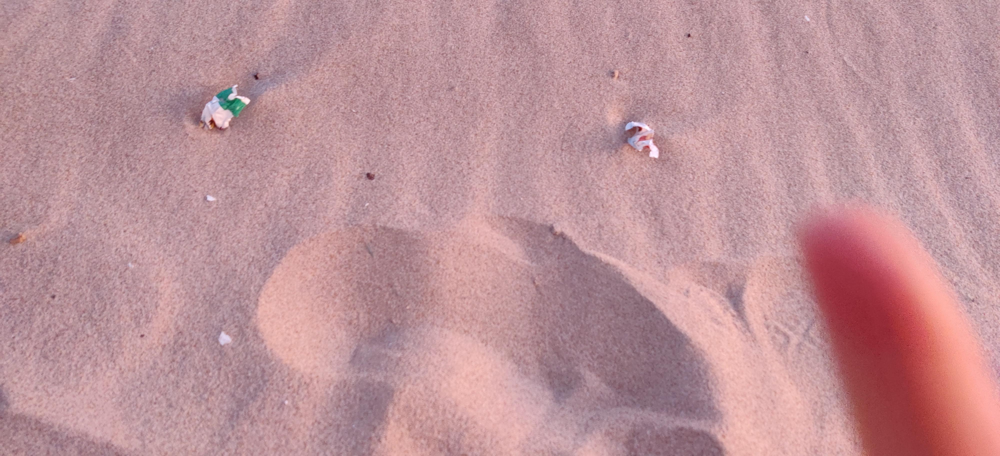

In [ ]:
display.Image(filename='/content/yolov5/runs/detect/exp/000079.jpg', width=600)

##Export to tflite

In [4]:
!python export.py --weights '/content/gdrive/MyDrive/Capstone/img800.pt' --include saved_model tflite --data '/content/taco75.yaml' --device 0 --imgsz 640 640


export: data=/content/taco75.yaml, weights=['/content/gdrive/MyDrive/Capstone/img800.pt'], imgsz=[640, 640], batch_size=1, device=0, half=False, inplace=False, train=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['saved_model', 'tflite']
YOLOv5 🚀 v6.1-251-gc23a441 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5s6 summary: 280 layers, 12550876 parameters, 0 gradients

PyTorch: starting from /content/gdrive/MyDrive/Capstone/img800.pt with output shape (1, 25500, 69) (24.4 MB)

TensorFlow SavedModel: starting export with tensorflow 2.8.2...

                 from  n    params  module                                  arguments                     
2022-06-12 14:56:52.061332: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because th

normalize data

In [ ]:
!pip install tflite-support

In [ ]:
from tflite_support.metadata_writers import object_detector
from tflite_support.metadata_writers import writer_utils
from tflite_support import metadata
ObjectDetectorWriter = object_detector.MetadataWriter
_MODEL_PATH = "/content/gdrive/MyDrive/Capstone/yolo5x_75_sgd-fp16.tflite"
# Task Library expects label files that are in the same format as the one below.
_LABEL_FILE = "labelmap.txt"
_SAVE_TO_PATH = "/content/yolo5x_75_sgd.tflite"
# Normalization parameters is required when reprocessing the image. It is
# optional if the image pixel values are in range of [0, 255] and the input
# tensor is quantized to uint8. See the introduction for normalization and
# quantization parameters below for more details.
# https://www.tensorflow.org/lite/convert/metadata#normalization_and_quantization_parameters)
_INPUT_NORM_MEAN = 127.5
_INPUT_NORM_STD = 127.5

# Create the metadata writer.
writer = ObjectDetectorWriter.create_for_inference(
    writer_utils.load_file(_MODEL_PATH), [_INPUT_NORM_MEAN], [_INPUT_NORM_STD],
    [_LABEL_FILE])

# Verify the metadata generated by metadata writer.
print(writer.get_metadata_json())

# Populate the metadata into the model.
writer_utils.save_file(writer.populate(), _SAVE_TO_PATH)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 42.5 MB 1.3 MB/s 
     |████████████████████████████████| 213 kB 70.1 MB/s 
     |████████████████████████████████| 1.0 MB 50.9 MB/s 
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.17.3
    Uninstalling protobuf-3.17.3:
      Successfully uninstalled protobuf-3.17.3
  Attempting uninstall: flatbuffers
    Found existing installation: flatbuffers 2.0
    Uninstalling flatbuffers-2.0:
      Successfully uninstalled flatbuffers-2.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.8.2+zzzcolab20220527125636 requires protobuf<3.20,>=3.9.2, but you have protobuf 3.20.1 which is incompatible.


{
  "name": "ObjectDetector",
  "description": "Identify which of a known set of objects might be present and provide information about their positions within the given image or a video stream.",
  "subgraph_metadata": [
    {
      "input_tensor_metadata": [
        {
          "name": "image",
          "description": "Input image to be detected.",
          "content": {
            "content_properties_type": "ImageProperties",
            "content_properties": {
              "color_space": "RGB"
            }
          },
          "process_units": [
            {
              "options_type": "NormalizationOptions",
              "options": {
                "mean": [
                  127.5
                ],
                "std": [
                  127.5
                ]
              }
            }
          ],
          "stats": {
            "max": [
              1.0
            ],
            "min": [
              -1.0
            ]
          }
        }
      ],
     

/usr/local/lib/python3.7/dist-packages/tensorflow_lite_support/metadata/python/metadata.py:397: UserWarning: File, 'labelmap.txt', does not exist in the metadata. But packing it to tflite model is still allowed.
  "tflite model is still allowed.".format(f))
